In [1]:
import torch
import diffusers
from utils import patch_attention_proc, remove_patch
from diffusers.utils.import_utils import is_xformers_available
from torch.nn import functional as F

xformers_is_available = is_xformers_available()

if hasattr(F, "scaled_dot_product_attention"):
    torch2_is_available = True
else:
    torch2_is_available = False



[2024-01-25 14:09:17,046] [INFO] [real_accelerator.py:161:get_accelerator] Setting ds_accelerator to cuda (auto detect)


In [2]:
model_name = "Lykon/DreamShaper"
device = "cuda" if torch.cuda.is_available() else "cpu"
dtype = torch.float16 if device == "cuda" else torch.float32

pipe = diffusers.StableDiffusionPipeline.from_pretrained(model_name).to(device, dtype)
if xformers_is_available and not torch2_is_available:
    pipe.enable_xformers_memory_efficient_attention()
pipe.scheduler = diffusers.EulerDiscreteScheduler.from_config(pipe.scheduler.config)
pipe.safety_checker = None

unet/diffusion_pytorch_model.safetensors not found


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

/home/ubuntu/.local/lib/python3.8/site-packages/transformers/models/clip/feature_extraction_clip.py:28: FutureWarning: The class CLIPFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use CLIPImageProcessor instead.
  warnings.warn(


In [3]:
# regular gen first
seed = 123
steps = 25
height = 2048
width = 2048
prompt = "a painting of a cat"
negative_prompt = "bad quality"
guidance_scale = 8

remove_patch(pipe)
torch.manual_seed(seed)

base_img = pipe(prompt,
                num_inference_steps=steps, 
                height=height,
                width=width,
                negative_prompt=negative_prompt,
                guidance_scale=guidance_scale
                ).images[0]


  0%|          | 0/25 [00:00<?, ?it/s]

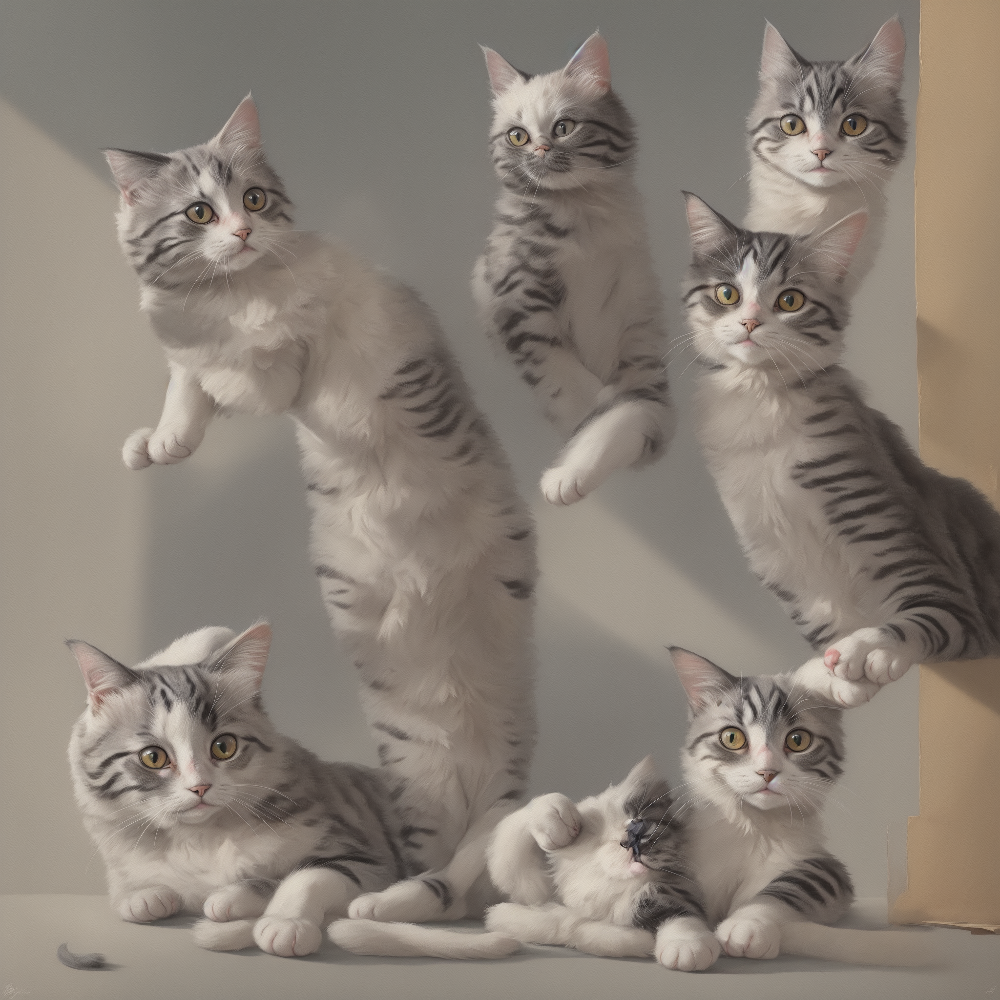

In [4]:
base_img

In [5]:
pipe.unet.down_blocks[0].attentions[0].transformer_blocks[0].attn1.processor

In [12]:
downsample_factor = 4
ratio = 0.75
merge_method = "downsample"
merge_tokens = "keys/values"
downsample_method = "nearest-exact"
timestep_threshold_switch = 0.3
timestep_threshold_stop = 0.0
secondary_merge_method = "similarity"
extra_guidance_scale = 1.5

token_merge_args = {"ratio": ratio, # ratio of how much tokens to merge for similarity method, will be used if you specify similarity for method or once the method switches
                    "merge_tokens": merge_tokens, # ["keys/values","all"] # which tokens to merge, either keys/values or all
                    "merge_method": merge_method, # ["none","similarity", "downsample"] # which method to use for merging tokens
                    "downsample_method": downsample_method, # specify any of the interpolation methods used for F.interpolate. spoiler, this one works the best and is the fastest
                    "downsample_factor": downsample_factor, # factor to downsample tokens by, seems best to use an integer
                    "timestep_threshold_switch": timestep_threshold_switch, # if using downsample, what % left of generation to switch to secondary method, 0.3 means once 30% of generation is left, switch to similarity method
                    "timestep_threshold_stop": timestep_threshold_stop, # what % left in the run to revert to normal attention, 0.0 means never revert
                    "secondary_merge_method": secondary_merge_method, # ["none","similarity", "downsample"] # which method to use for merging tokens once the threshold is reached
                    "downsample_factor_level_2": 1, # downsample amount to use for down block 2 depth, 1 is typically fine here as the largest resolution blocks are most expensive, but can try 2 for very large resolutions
                    "ratio_level_2": 0.0, # ratio for similarity based merging for down block 2 depth, 0.0 means never use similarity based merging
                    }

patch_attention_proc(pipe.unet, token_merge_args=token_merge_args)

torch.manual_seed(seed)

merged_img = pipe(prompt,
                    num_inference_steps=steps, 
                    height=height, 
                    width=width,
                    negative_prompt=negative_prompt,
                    guidance_scale=guidance_scale + extra_guidance_scale # adding a lil to the guidance scale seems to help compensate
                    ).images[0]

  0%|          | 0/25 [00:00<?, ?it/s]

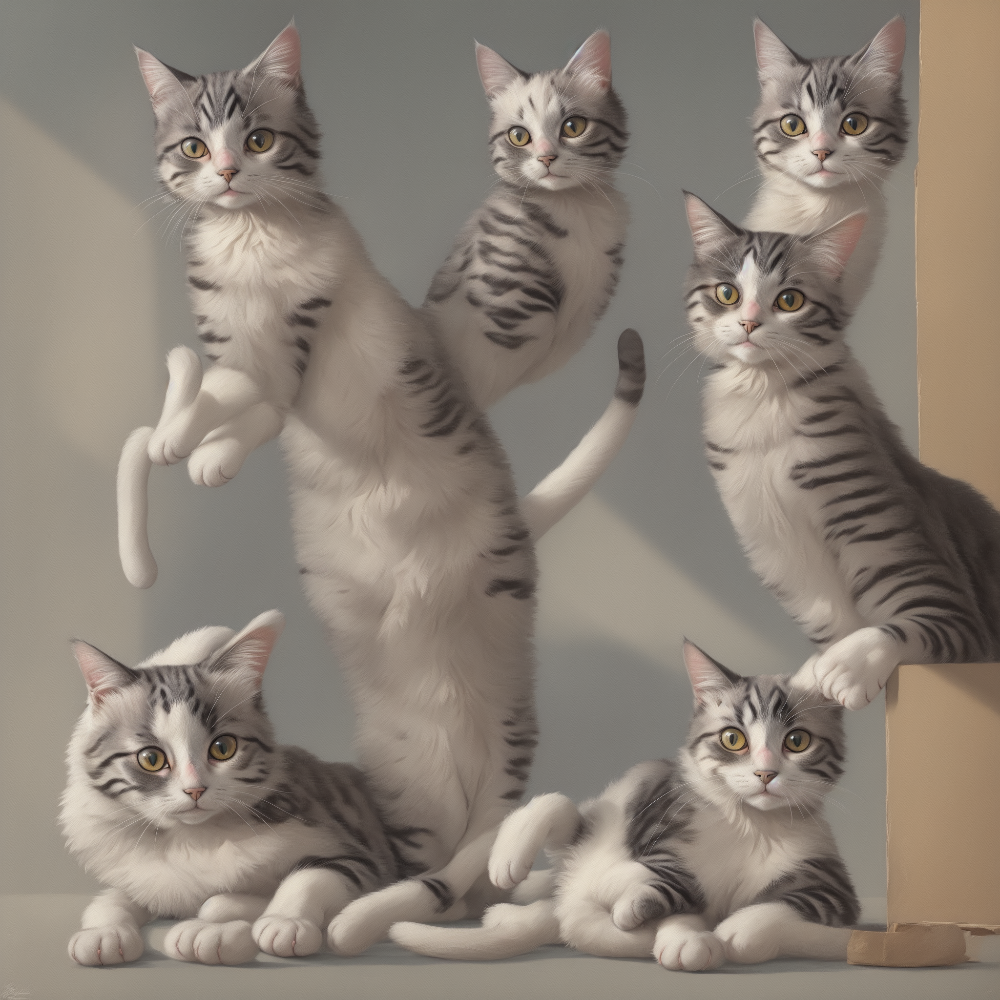

In [13]:
merged_img

In [8]:
pipe.unet._tome_info

{'size': (256, 256),
 'timestep': 1.0,
 'hooks': [<torch.utils.hooks.RemovableHandle at 0x7f4a55756b50>],
 'args': {'ratio': 0.75,
  'sx': 2,
  'sy': 2,
  'use_rand': True,
  'generator': <torch._C.Generator at 0x7f4a556e6a50>,
  'merge_tokens': 'keys/values',
  'merge_method': 'downsample',
  'downsample_method': 'nearest-exact',
  'downsample_factor': 4,
  'timestep_threshold_switch': 0.2,
  'timestep_threshold_stop': 0.0,
  'secondary_merge_method': 'similarity',
  'downsample_factor_level_2': 2,
  'ratio_level_2': 0.5}}

In [9]:
pipe.unet.down_blocks[0].attentions[0].transformer_blocks[0].attn1.processor